# Import Libraries

In [1]:
# Open source Python module with which we can quickly do an exploratory data analysis with just a few lines of code
# Must reset Google Colab Notebook 
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 

     |████████████████████████████████| 25.9 MB 34 kB/s 
     |████████████████████████████████| 10.9 MB 6.0 MB/s 
     |████████████████████████████████| 596 kB 52.3 MB/s 
     |████████████████████████████████| 102 kB 315 kB/s 
     |████████████████████████████████| 690 kB 48.7 MB/s 
     |████████████████████████████████| 4.7 MB 43.7 MB/s 
     |████████████████████████████████| 63 kB 1.6 MB/s 
     |████████████████████████████████| 812 kB 41.2 MB/s 
     |████████████████████████████████| 38.1 MB 1.2 MB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-3.1.1-py2.py3-none-any.whl size=261287 sha256=d4d486e0e7aa80b350da42c1cd1949bf0679f7277409c0363c726635eeacbca4
  Stored in directory: /tmp/pip-ephem-wheel-cache-epbxgge2/wheels/cc/d5/09/083fb07c9363a2f45854b0e3a7de7d7c560f07da74b9e9769d
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=5103ad21cc86ee98c0f0c7c715a8fede243d2f4aebc8c435aa350aa051458689
  Stored in directory: /root

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve
%matplotlib notebook
from typing import List, Tuple, Callable, Dict, Union 
from typing import Tuple
from typing import Union
from tqdm import tqdm


from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, cross_val_predict
from sklearn.metrics import confusion_matrix, roc_curve, f1_score, recall_score, precision_score, accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import OneHotEncoder, StandardScaler, MinMaxScaler, normalize
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.impute import SimpleImputer 
from sklearn.ensemble import RandomForestClassifier
from pandas_profiling import ProfileReport

%matplotlib inline

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


# Load and Set Up Data


In [3]:
# Imports Dataset into Directory "/content/"
# Every time this line is ran, you must choose a file to import or else you may not move forward 
from google.colab import files
uploaded = files.upload()

Saving heart.csv to heart.csv


In [4]:
# Reads Data File as Variable Data 
Data = pd.read_csv('/content/heart.csv')

# Rename Columns 
Data = Data.rename(columns={'cp':'Chest Pain'})
Data = Data.rename(columns={'trtbps':'Resting BP'})
Data = Data.rename(columns={'fbs':'Fasting Blood Sug'})
Data = Data.rename(columns={'restecg':'Resting Elec Result'})
Data = Data.rename(columns={'thalachh':'Max Heart Rate'})
Data = Data.rename(columns={'exng':'Exercise'})
Data = Data.rename(columns={'output':'Heart Attack'})
Data = Data.rename(columns={'oldpeak':'Previous Peak'})

# Prints first 5 rows of Dataset
Data.head()

,age,sex,Chest Pain,Resting BP,chol,Fasting Blood Sug,Resting Elec Result,Max Heart Rate,Exercise,Previous Peak,slp,caa,thall,Heart Attack
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1


In [5]:
# Checks if there are any Null or NA values in Dataset 
Data.isnull().values.any()

False

# Analysis of Statistical Properties of the Data
- We want to get the properties of the features and check if they are of different order of magnitude to see if we must normalize
- Because some of the features are categorical and some of them are continuous, we must scale the data as seen in class 
-Descriptive statistics include those that summarize the central tendency, dispersion and shape of a dataset’s distribution, excluding NaN values.

In [6]:
Data.describe()

,age,sex,Chest Pain,Resting BP,chol,Fasting Blood Sug,Resting Elec Result,Max Heart Rate,Exercise,Previous Peak,slp,caa,thall,Heart Attack
count,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000
mean,54.366337,0.683168,0.966997,131.623762,246.264026,0.148515,0.528053,149.646865,0.326733,1.039604,1.399340,0.729373,2.313531,0.544554
std,9.082101,0.466011,1.032052,17.538143,51.830751,0.356198,0.525860,22.905161,0.469794,1.161075,0.616226,1.022606,0.612277,0.498835
min,29.000000,0.000000,0.000000,94.000000,126.000000,0.000000,0.000000,71.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,47.500000,0.000000,0.000000,120.000000,211.000000,0.000000,0.000000,133.500000,0.000000,0.000000,1.000000,0.000000,2.000000,0.000000
50%,55.000000,1.000000,1.000000,130.000000,240.000000,0.000000,1.000000,153.000000,0.000000,0.800000,1.000000,0.000000,2.000000,1.000000
75%,61.000000,1.000000,2.000000,140.000000,274.500000,0.000000,1.000000,166.000000,1.000000,1.600000,2.000000,1.000000,3.000000,1.000000
max,77.000000,1.000000,3.000000,200.000000,564.000000,1.000000,2.000000,202.000000,1.000000,6.200000,2.000000,4.000000,3.000000,1.000000


# Analyzing Distribution of Discrete Features 
- We want to see how the categorical features are distributed among the population. Ideally, no feature is over-representated so that it does not bias the model.



''

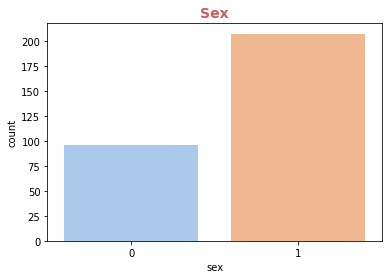

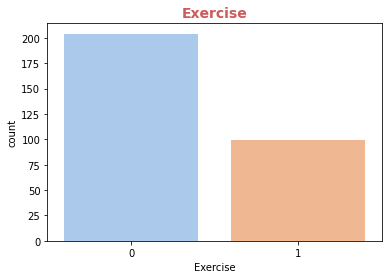

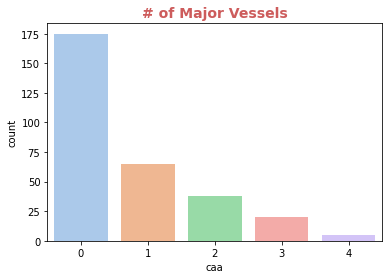

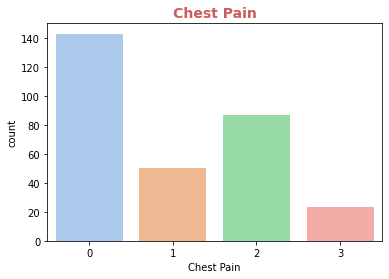

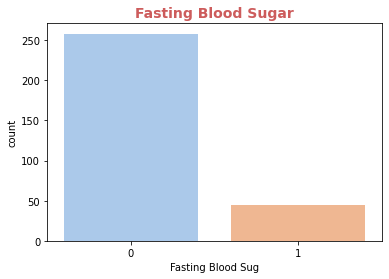

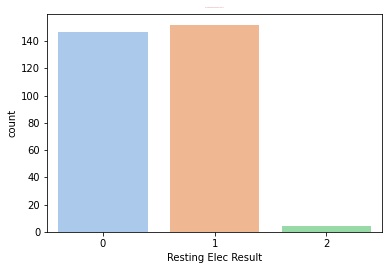

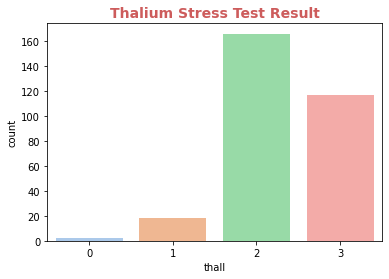

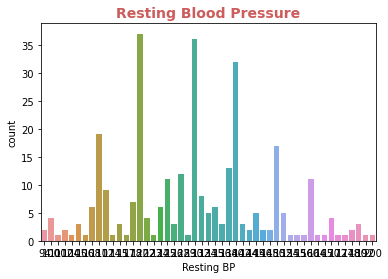

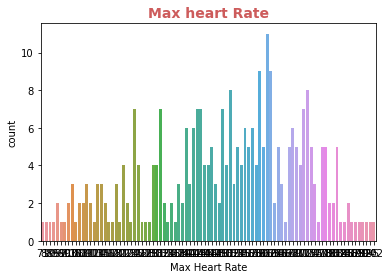

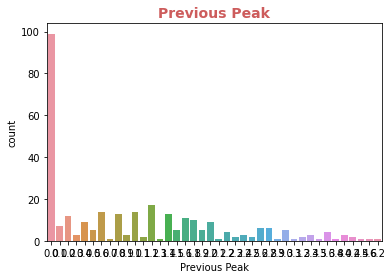

In [12]:
sns.set_palette("pastel")

# Sex Distribution Plot
fig,ax1=plt.subplots()
plt.title('Sex',fontsize=14, fontweight='bold', fontname='Arial Narrow', color="indianred")
sns.countplot(ax=ax1,data=Data,x='sex')

# Exercise Distribution Plot
fig,ax2=plt.subplots()
plt.title('Exercise',fontsize=14, fontweight='bold', fontname='Arial Narrow', color="indianred")
sns.countplot(ax=ax2,data=Data,x='Exercise')

# Number Of Major Vessels Distribution Plot
fig,ax3=plt.subplots()
plt.title('# of Major Vessels',fontsize=14, fontweight='bold', fontname='Arial Narrow', color="indianred")
sns.countplot(ax=ax3,data=Data,x='caa')

# Chest Pain Distribution Plot
fig,ax4=plt.subplots()
plt.title('Chest Pain',fontsize=14, fontweight='bold', fontname='Arial Narrow', color="indianred")
sns.countplot(ax=ax4,data=Data,x='Chest Pain')

# Fasting Blood Sugar Distribution Plot 
fig,ax5=plt.subplots()
plt.title('Fasting Blood Sugar',fontsize=14, fontweight='bold', fontname='Arial Narrow', color="indianred")
sns.countplot(ax=ax5,data=Data,x='Fasting Blood Sug')

# Resting ElectroCardiographic Results Distrbution Plot
fig,ax6=plt.subplots()
plt.title('Resting ElectroCardiographic Results',fontsize=1, fontname='Arial Narrow', color="indianred")
sns.countplot(ax=ax6,data=Data,x='Resting Elec Result')

# Thalium Stress Test result Distribution Plot
fig,ax10=plt.subplots()
plt.title('Thalium Stress Test Result',fontsize=14, fontweight='bold', fontname='Arial Narrow', color="indianred")
sns.countplot(ax=ax10,data=Data,x='thall')

# Resting Blood Pressure Distribution Plot
fig,ax9=plt.subplots()
plt.title('Resting Blood Pressure',fontsize=14, fontweight='bold', fontname='Arial Narrow', color="indianred")
sns.countplot(ax=ax9,data=Data,x='Resting BP')


# Max Heart Rate Distribution Plot
fig,ax7=plt.subplots()
plt.title('Max heart Rate',fontsize=14, fontweight='bold', fontname='Arial Narrow', color="indianred")
sns.countplot(ax=ax7,data=Data,x='Max Heart Rate')


# Previous Peak Distribution Plot
fig,ax8=plt.subplots()
plt.title('Previous Peak',fontsize=14, fontweight='bold', fontname='Arial Narrow', color="indianred")
sns.countplot(ax=ax8,data=Data,x='Previous Peak')
;

# Analyzing of Distribution of Continuous Features 

- We want to see if our sample is representatative of the population. Ideally, the distribution should be a normal distribution, again so that no over-representation biases the model.

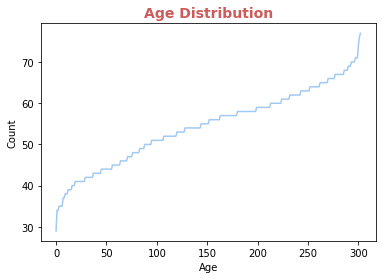

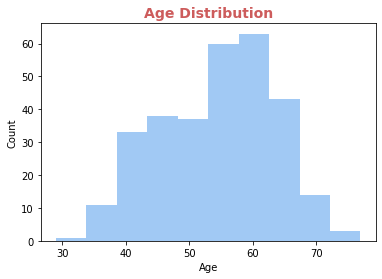

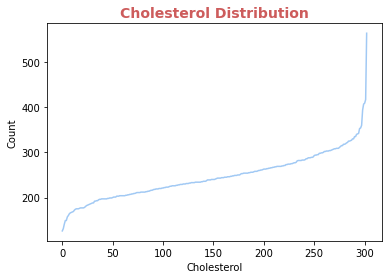

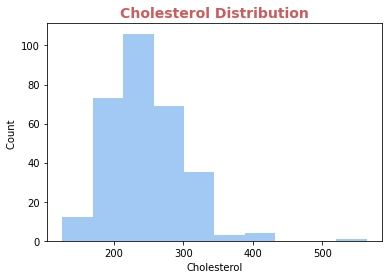

In [11]:

Age_plot=np.sort(np.array(Data['age']))
sns.set_palette("pastel")
plt.plot(Age_plot)
plt.xlabel('Age')
plt.ylabel('Count')
plt.title('Age Distribution',fontsize=14, fontweight='bold', fontname='Arial Narrow', color="indianred")


fig,ax=plt.subplots()
plt.hist(Data['age'])
plt.xlabel('Age')
plt.ylabel('Count')
plt.title('Age Distribution',fontsize=14, fontweight='bold', fontname='Arial Narrow', color="indianred")

fig,ax1=plt.subplots()
Chol_plot=np.sort(np.array(Data['chol']))
ax1.plot(Chol_plot)
ax1.set_xlabel('Cholesterol')
ax1.set_ylabel('Count')
plt.title('Cholesterol Distribution',fontsize=14, fontweight='bold', fontname='Arial Narrow', color="indianred");


fig,ax2=plt.subplots()
ax2.hist(Data['chol'])
ax2.set_xlabel('Cholesterol')
ax2.set_ylabel('Count ')
plt.title('Cholesterol Distribution',fontsize=14, fontweight='bold', fontname='Arial Narrow', color="indianred");


We use pandas profiling report to obtain:
- The correlations between the features: If features are correlated, we only keep the ones that are significantly correlated to the outputs. 
- All the statistical characteritics of the features and the target variable.


In [13]:
profile = ProfileReport(Data)
profile.to_widgets();

/usr/local/lib/python3.7/dist-packages/pandas_profiling/profile_report.py:406: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  "Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60)."


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

# Analysis of Heart Attack Distribution 
- The problem is a binary classification, the target variable we want to predict is either 0: No heart attack (normal state), or 1: heart attack (abnormal state).
- We check the distribution of the output to ensure balanced class distribution

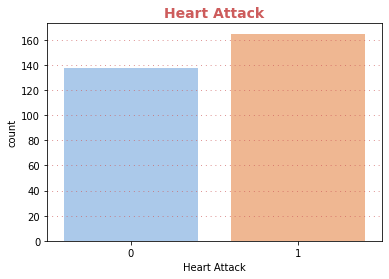

In [14]:
fig,ax1=plt.subplots()
sns.set_palette("pastel")
plt.title('Heart Attack',fontsize=14, fontweight='bold', fontname='Arial Narrow', color="indianred")
ax1.grid(color='indianred', linestyle=':', axis='y', zorder=0,  dashes=(1,5))
sns.countplot(ax=ax1,data=Data,x='Heart Attack');


# Feature selection and Creating Training/Test Sets 
- Based on the correlations given by Pandas profiling, we select the continious variables that will belong to the model. Every time two variables are highly correlated, we check which one makes more sense/ is more correlated to the output and we drop the other one

In [15]:
# Continuous Variables
continuous_variables = [
    "age",
    "Resting BP",
    "chol",
    "Previous Peak","Max Heart Rate"
]

We process the data in such a way that the data makes more sense. Every feature that represented before as a column of numbers is now reprented with multiple columns that have '0' when the value is not true and 1 when the value is true. We also scale the Input matrix so that all features are of same order of magnitude. 

In [16]:
# Creates Dummy Variables in Dataset for Classification
cat_cols = ['Chest Pain',]
con_cols = ["age","chol","Max Heart Rate","Previous Peak"]
Data2 = pd.get_dummies(Data, columns = cat_cols, drop_first = True)

# Creates X and Y sets to be used for Training and Test Data 
X = Data2.copy().drop(['Heart Attack','Exercise','sex','slp','Resting Elec Result'], axis = 1)
Y = Data2['Heart Attack']

scaler = StandardScaler()
scaler.fit(X)
X = scaler.transform(X)


We split the data into a training set and a test set. We will train our model on the training set and then test the accuracy on the testing set. To split our data, we pick the usual proportions: 80% for the training set and 20% for the test set. 

In [17]:
# Creates Training and Test Data 20% Test 80% Training
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size = 0.2, random_state = 42)
Shapes=np.array([X_train.shape,X_test.shape,y_train.shape,y_test.shape])


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  This is separate from the ipykernel package so we can avoid doing imports until


# Logistic Regression 


We plot the continious features against the target variable to check if we can see some patters/ some clear tresholds. For instance people who have a heart rate lower than 80 are less likely to have a heart attack

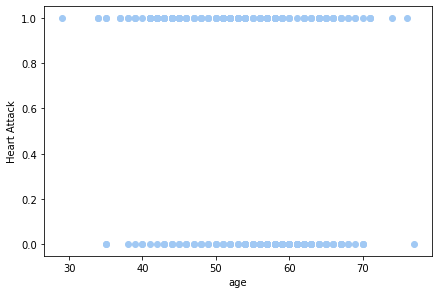

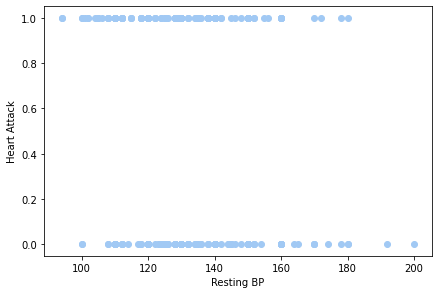

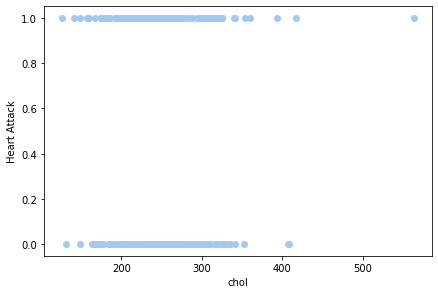

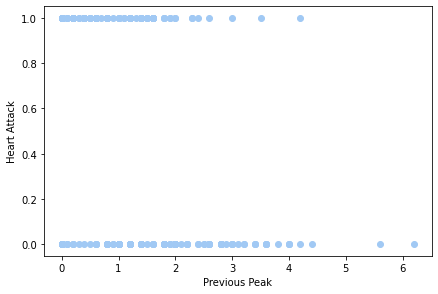

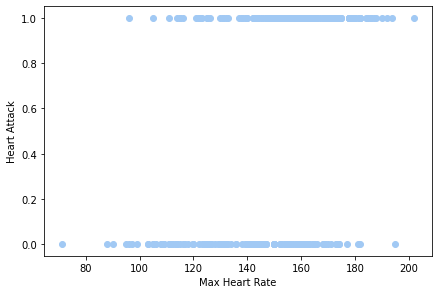

In [18]:
# Logistic Regression of Continuous Variables w/ Output Heart Attack
continuous_variables = [
    "age",
    "Resting BP",
    "chol",
    "Previous Peak","Max Heart Rate"
]
for variable in continuous_variables:
    plt.figure()
    plt.scatter(x=variable, y="Heart Attack", data=Data)
    plt.tight_layout()
    plt.xlabel(str(variable))
    plt.ylabel('Heart Attack');

We declare our model, train it on the training sample and test it on the test set. Then we check the accuracy to see how well the model does

In [19]:
## Fitting and Predicting using Logistic Regresion 

# instantiating the object
logreg = LogisticRegression()

# fitting the object
logreg.fit(X_train, y_train)

# calculating the probabilities
y_pred_proba = logreg.predict_proba(X_test)  ### this goes after model=smf.glm() replace X_test with the values, but it might not work

# finding the predicted valued
y_pred = np.argmax(y_pred_proba,axis=1)

# printing the test accuracy
print("The test accuracy score of Logistric Regression is ", accuracy_score(y_test, y_pred))


The test accuracy score of Logistric Regression is  0.8688524590163934


# Logistic Regression with Bootstrap 

We bootstrap our samples to try our model on different randomly sampled subsets of the data sample to obtain a better accuracy. Then we check the variance of the parameters Beta. This is an aggregation method we have seen in class

In [20]:
cat_cols = ['Chest Pain',]
con_cols = ["age","chol","Max Heart Rate","Previous Peak"]

# Creates Dummy Variables
Data2 = pd.get_dummies(Data, columns = cat_cols, drop_first = True)

# Creates X Y Dataset for bootstrap 
Y = Data2['Heart Attack']
X= Data2.copy().drop(['Heart Attack','Exercise','sex','slp','Resting Elec Result'], axis = 1)

scaler = StandardScaler()
scaler.fit(X)
X = scaler.transform(X)

np.random.seed(42)

B = 1000  # number of bootstrap

betas = []

for i in range(X.shape[1]+1):
  betas.append([])

for _ in tqdm(range(B)):
  # bootstrap the indices and build the bootstrap data
    
  idx = np.random.randint(low=0, high=len(Data2), size=len(Data2))
  data_bootstrap = Data2.iloc[idx]
  X= data_bootstrap.copy().drop(['Heart Attack','Exercise','sex','slp','Resting Elec Result'], axis = 1)
  scaler = StandardScaler()
  scaler.fit(X)
  X = scaler.transform(X)
  Y = data_bootstrap['Heart Attack']

  model_bootstrap = LogisticRegression(penalty="none", random_state=42)
  model_bootstrap.fit(X = X,y =Y)
  for i in range(11):
    betas[i].append(model_bootstrap.coef_.flatten()[i])


100%|██████████| 1000/1000 [00:13<00:00, 74.86it/s]


In [21]:
Data2.head()

,age,sex,Resting BP,chol,Fasting Blood Sug,Resting Elec Result,Max Heart Rate,Exercise,Previous Peak,slp,caa,thall,Heart Attack,Chest Pain_1,Chest Pain_2,Chest Pain_3
0,63,1,145,233,1,0,150,0,2.3,0,0,1,1,0,0,1
1,37,1,130,250,0,1,187,0,3.5,0,0,2,1,0,1,0
2,41,0,130,204,0,0,172,0,1.4,2,0,2,1,1,0,0
3,56,1,120,236,0,1,178,0,0.8,2,0,2,1,1,0,0
4,57,0,120,354,0,1,163,1,0.6,2,0,2,1,0,0,0


We print the means and standard error of the betas obtained by bootstraping the data set. 


In [22]:
# Finds Beta Values
betasf =[]
for i in range(len(betas)):
  betasf.append(np.mean(betas[i]))
  print("The mean of beta",i,f" is {betasf[i]:5.3f}.")
  print("The standard error of beta",i,f" is {np.std(betas[i], ddof=1):5.3f}.\n")




The mean of beta 0  is 0.103.
The standard error of beta 0  is 0.193.

The mean of beta 1  is -0.314.
The standard error of beta 1  is 0.201.

The mean of beta 2  is -0.121.
The standard error of beta 2  is 0.173.

The mean of beta 3  is -0.146.
The standard error of beta 3  is 0.205.

The mean of beta 4  is 0.661.
The standard error of beta 4  is 0.227.

The mean of beta 5  is -0.929.
The standard error of beta 5  is 0.272.

The mean of beta 6  is -0.864.
The standard error of beta 6  is 0.240.

The mean of beta 7  is -0.708.
The standard error of beta 7  is 0.213.

The mean of beta 8  is 0.561.
The standard error of beta 8  is 0.211.

The mean of beta 9  is 1.057.
The standard error of beta 9  is 0.215.

The mean of beta 10  is 0.591.
The standard error of beta 10  is 0.214.

The mean of beta 11  is   nan.
The standard error of beta 11  is   nan.



/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:263: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims, where=where)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:223: RuntimeWarning: invalid value encountered in true_divide
  subok=False)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:254: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Calculation of the predictions on the test set + accuracy

In [23]:
linear = 0
Y_pred = []
betasf = np.array(betasf)
def sigmoid(x):
  return(1/(1+np.exp(-x)))

for i in range(1):
  linear = betasf[0]
  l = X_train.shape[1]
  for j in range(l):
    
    a = betasf[j]*X_train[i,j]
    linear += a
    print(a)
  #if sigmoid(linear) > 0.5:
   # Y_pred.append(1)

-0.1409374033974898
0.20859934020702944
-0.11369645474565349
0.06106745197115864
0.35694360868825753
0.8334736642900771
0.6175661086975434
0.3632096212375379
1.2627055090374735
-0.670757413005524
-0.16931342784651288


We try the logistic regression using stats model and we compare it to the logistic regression using scikit learn

In [24]:
Data2.columns

Index(['age', 'sex', 'Resting BP', 'chol', 'Fasting Blood Sug',
       'Resting Elec Result', 'Max Heart Rate', 'Exercise', 'Previous Peak',
       'slp', 'caa', 'thall', 'Heart Attack', 'Chest Pain_1', 'Chest Pain_2',
       'Chest Pain_3'],
      dtype='object')

In [25]:

Data2 = Data2.rename(columns={'Chest Pain_1':'ChestPain_1'})
Data2 = Data2.rename(columns={'Chest Pain_2':'ChestPain2'})
Data2 = Data2.rename(columns={'Chest Pain_3':'ChestPain_3'})
Data2 = Data2.rename(columns={'Previous Peak':'PreviousPeak'})
Data2 = Data2.rename(columns={'Fasting Blood Sug':'FastingBloodSug'})
Data2 = Data2.rename(columns={'Resting BP':'RestingBP'})
Data2 = Data2.rename(columns={'Max Heart Rate':'MaxHeartRate'})
Data2 = Data2.rename(columns={'Resting Elec Result':'RestingElecResult'})
Data2 = Data2.rename(columns={'Heart Attack':'HeartAttack'})


# Generalized Linear Model Regression Results
model = smf.glm(
    formula='HeartAttack ~ age+thall+ChestPain_1+ChestPain2+ChestPain_3+RestingBP+chol+FastingBloodSug+RestingElecResult+MaxHeartRate+PreviousPeak+caa',
    data=Data2,
    family=sm.families.Binomial())
result = model.fit()
print(result.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:            HeartAttack   No. Observations:                  303
Model:                            GLM   Df Residuals:                      290
Model Family:                Binomial   Df Model:                           12
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -116.23
Date:                Tue, 05 Apr 2022   Deviance:                       232.46
Time:                        19:50:45   Pearson chi2:                     297.
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept             0.7612      2.25

# Support Vector Machine

We use a linear SVM again on the training set then we test the accuracy on the test sample.

In [26]:
from sklearn import svm
from sklearn.metrics import accuracy_score

# Creates SVM Fit using x-y training data
clf = svm.SVC(kernel='linear', C=1, random_state=42).fit(X_train,y_train)

# Predicts Output of X_test
y_pred = clf.predict(X_test)

# Printing the Test Accuracy Comparing y_test with y_pred
print("The test accuracy score of SVM is ", accuracy_score(y_test, y_pred))

The test accuracy score of SVM is  0.8524590163934426


In [27]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
svm = SVC()

parameters = {"C":np.arange(1,10,1),'gamma':[0.00001,0.0001, 0.0003,0.0005,0.001,0.005,0.01,0.05,0.1,0.7,1,5]}

finder = GridSearchCV(svm, parameters)
finder.fit(X_train, y_train)

print("The best parameters are:", finder.best_params_)
print("The best score is:", finder.best_score_)
y_pred = finder.predict(X_test)


print("The test accuracy score of SVM after hyper-parameter tuning is ", accuracy_score(y_test, y_pred))

The best parameters are: {'C': 5, 'gamma': 0.05}
The best score is: 0.8020408163265307
The test accuracy score of SVM after hyper-parameter tuning is  0.8524590163934426


# Random Forest

In [28]:
# Random Forest Model

# Calculate Forest Mean Score
forest_clf = RandomForestClassifier(n_estimators=150, random_state=666)
forest_scores = cross_val_score(forest_clf, X_train, y_train, cv=10)
forest_scores.mean()

0.7606666666666667

In [29]:
# Train Random Forest Model
param_grid = {
                 'n_estimators': [12,13,14,15],
                 'max_depth': [3,4,5,6]
             }
ForestCV = GridSearchCV(forest_clf, param_grid, cv=10)
ForestCV.fit(X_train, y_train)

GridSearchCV(cv=10,
             estimator=RandomForestClassifier(n_estimators=150,
                                              random_state=666),
             param_grid={'max_depth': [3, 4, 5, 6],
                         'n_estimators': [12, 13, 14, 15]})

In [30]:
# Best Paramters For Testing
ForestCV.best_params_

{'max_depth': 4, 'n_estimators': 13}

In [31]:
# Test Accuracy and Confusion Matrix
print("Accuracy on the test set:", ForestCV.score(X_test, y_test))

cm = confusion_matrix(y_test, ForestCV.predict(X_test))
print("Confusion matrix on the test set:", cm)

Accuracy on the test set: 0.819672131147541
Confusion matrix on the test set: [[23  6]
 [ 5 27]]


# ROC Curve of Random forest


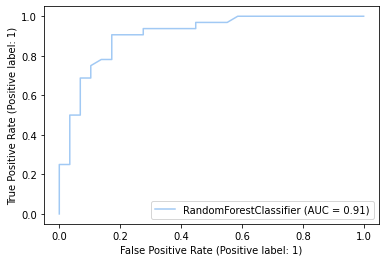

In [32]:
# ROC 


from sklearn.metrics import RocCurveDisplay

forest_clf.fit(X_train,y_train)
svm_disp = RocCurveDisplay.from_estimator(forest_clf, X_test, y_test)
plt.show()

# ROC curve of Logistic regression

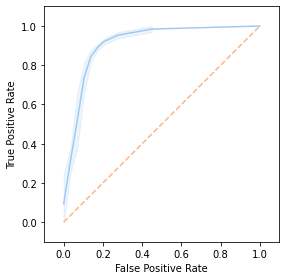

In [33]:
# ROC 




# calculating the probabilities
y_pred_prob = logreg.predict_proba(X_test)[:,1]

# instantiating the roc_cruve
fpr,tpr,threshols=roc_curve(y_test,y_pred_prob)




# make plot
plt.figure()
# plot the ROC
sns.lineplot(x=fpr, y=tpr)
# plot the diagonal line
sns.lineplot(x=[0, 1], y=[0, 1], linestyle="--")


plt.gca().set_aspect("equal")
plt.gca().set_xlabel("False Positive Rate")
plt.gca().set_ylabel("True Positive Rate")
plt.gca().set_xlim([-.1, 1.1])
plt.gca().set_ylim([-.1, 1.1])
plt.tight_layout()
plt.show()

# ROC Curve of svm

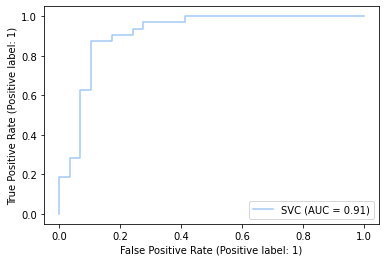

In [34]:
# ROC 


from sklearn.metrics import RocCurveDisplay


svm_disp = RocCurveDisplay.from_estimator(clf, X_test, y_test)
plt.show()


